In [1]:
#Import the modules
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
from nltk.cluster import KMeansClusterer, \
    cosine_distance,\
    euclidean_distance
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import metrics
from nltk.corpus import stopwords
from sklearn import metrics
import numpy as np
from sklearn import mixture
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score,silhouette_samples

In [2]:
#read the csv into DataFrame
df = pd.read_csv("C:/Sem 2/web mining/git clone/BIA-660-main/dataset/all_reviews_processed.csv")

In [3]:
df.head()

,Date,Resturant Name,Rating,Review,Source
0,11/7/2021,10Th And Willow Bar And Grill Hoboken,5,loved place much appetizer look great decided ...,Yelp
1,11/1/2021,10Th And Willow Bar And Grill Hoboken,1,terrible wing recommended go get wing got wate...,Yelp
2,7/7/2021,10Th And Willow Bar And Grill Hoboken,4,standard looking american bar inside tv sport ...,Yelp
3,6/14/2021,10Th And Willow Bar And Grill Hoboken,5,place n't get 5 star rating every patron walk ...,Yelp
4,5/2/2021,10Th And Willow Bar And Grill Hoboken,3,nothing special would really give 2 5 star cou...,Yelp


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61529 entries, 0 to 61528
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Date            61529 non-null  object
 1   Resturant Name  61529 non-null  object
 2   Rating          61529 non-null  int64 
 3   Review          61529 non-null  object
 4   Source          61529 non-null  object
dtypes: int64(1), object(4)
memory usage: 2.3+ MB


In [5]:
df.describe()

,Rating
count,61529.000000
mean,3.890816
std,1.386630
min,1.000000
25%,3.000000
50%,4.000000
75%,5.000000
max,5.000000


In [6]:
df.shape

(61529, 5)

In [7]:
#Unique rating values
df['Rating'].unique()

array([5, 1, 4, 3, 2], dtype=int64)

In [8]:
#Count of reviews per rating
df['Rating'].value_counts()

5    30203
4    13192
1     7169
3     6516
2     4449
Name: Rating, dtype: int64

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Rating', ylabel='count'>

Text(0.5, 1.0, 'Count of Reviews for each rating')

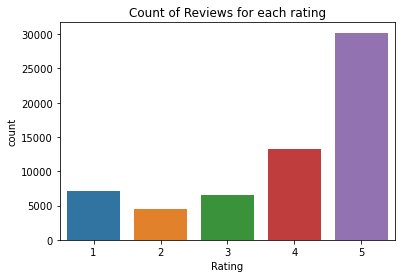

In [11]:
#Plot the count of Reviews for each Rating
sns.countplot(df.Rating)
plt.title('Count of Reviews for each rating')

In [11]:
#Group the Restaurants and Ratings and order in descending order of ratings
df.groupby(['Resturant Name'])['Rating'].mean().sort_values(ascending=False).reset_index()


,Resturant Name,Rating
0,Dining Room At Anthony David S,5.000000
1,Piccolos Cheesesteaks,5.000000
2,Amanda S,5.000000
3,Imposto S Pizza,5.000000
4,One12,4.952381
...,...,...
358,Insomnia Cookies Hoboken,2.977778
359,East La Hoboken,2.955000
360,Chipotle Mexican Grill,2.822581
361,Texas Arizona Hoboken,2.785714


<Figure size 1080x576 with 0 Axes>

<AxesSubplot:xlabel='Rating', ylabel='Resturant Name'>

Text(0.5, 1.0, 'Top 10 Rated Restaurants')

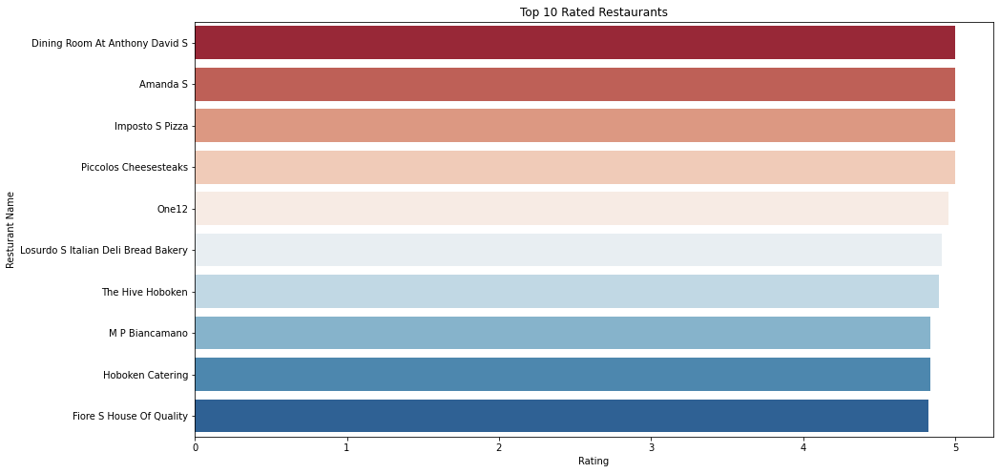

In [12]:
#Plot the top 10 highly rated restaurants
df_rating = df.groupby(['Resturant Name'])['Rating'].mean().sort_values(ascending=False).reset_index()
df_rating = df_rating.sort_values(by='Rating', ascending=False).head(10)

plt.figure(figsize=(15,8))
sns.barplot(data=df_rating, x='Rating', y='Resturant Name', palette='RdBu')
plt.title('Top 10 Rated Restaurants')

In [14]:
df['Resturant Name'].nunique()


363

In [15]:
df['Resturant Name'].value_counts()

Robongi Hoboken                           548
Benny Tudinos Pizzeria Hoboken            400
The Cuban Restaurant And Bar Hoboken 2    400
Halifax Hoboken 2                         400
Karma Kafe Hoboken                        400
                                         ... 
Hoboken Waterfront                         10
Proven Poke Co Hoboken                     10
Eco Hoboken                                 6
Taqueria Hoboken                            2
Dining Room At Anthony David S              2
Name: Resturant Name, Length: 363, dtype: int64

In [16]:
df[(df['Review'].isnull())  & df['Rating'].isnull()].shape


(0, 5)

In [17]:
df[(df['Review'].isnull())  & df['Rating'].notnull()].shape


(0, 5)

In [18]:
df[(df['Review'].isnull())  & df['Rating'].notnull()]


,Date,Resturant Name,Rating,Review,Source


In [19]:
df['Rating'].unique()


array([5, 1, 4, 3, 2], dtype=int64)

In [20]:
df[df['Rating'].isnull()].head()


,Date,Resturant Name,Rating,Review,Source


In [21]:
df[df['Rating'].isnull()]['Resturant Name'].nunique()


0

In [22]:
sent_df=df.loc[:,['Review','Rating']]


In [23]:
#Sentiments using ratings
def sentiment(rating):
  if rating>=3:
    return 1 # positive sentiment
  else:
    return 0

In [24]:
sent_df['sentiment']=sent_df['Rating'].apply(lambda x:sentiment(x))

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='sentiment', ylabel='count'>

Text(0.5, 1.0, 'Count of Reviews vs sentiment based on the Rating')

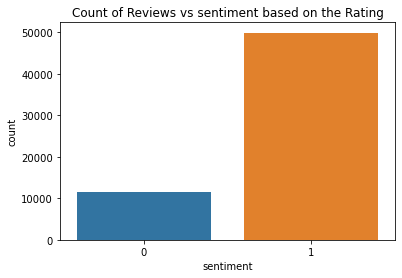

In [25]:
#Plot the sentiments and the count of reviews in each category
sns.countplot(sent_df['sentiment'])
plt.title('Count of Reviews vs sentiment based on the Rating')


In [26]:
sent_df.head()


,Review,Rating,sentiment
0,loved place much appetizer look great decided ...,5,1
1,terrible wing recommended go get wing got wate...,1,0
2,standard looking american bar inside tv sport ...,4,1
3,place n't get 5 star rating every patron walk ...,5,1
4,nothing special would really give 2 5 star cou...,3,1


In [27]:
import re


In [28]:
#Handle RegEx
def deEmojify(text):
    regrex_pattern = re.compile(pattern = "["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           "]+", flags = re.UNICODE)
    return regrex_pattern.sub(r'',text)

In [29]:
sent_df['Review']=sent_df['Review'].apply(lambda x:deEmojify(x))

In [30]:
a=sent_df[sent_df['Rating']==3]
a.set_index("Review", inplace = True)

In [31]:
a.head(10)


,Rating,sentiment
Review,,
nothing special would really give 2 5 star could asked seated outside honestly thing really enjoyed outdoor space ambiance really nice despite view bunch trash can outside restaurant ordered mexicali burger service slow took quite get food asked side upon ordering n't brought dish totally fine happens ask twice getting meal waiter came check table really n't enjoying time decided eat quick leave also took long time someone come around get check anyone control people surrounded wait really hard peaceful lunch nice day parent ipads sound loud kid screaming running around hectic also allowed table 2 turned table 4 n't social distanced properly irritating definitely impressed,3,1
came friend live local promptly stopped bouncer 7:30 pm yelled id lady guess hoboken thing require id even walking restaurant obliged super warm welcome got sat back corner promptly ordered drink waiter pretty good recommending certain thing went aeperol spritz moscow mule cucumber martini cucumber martini pretty tiny maybe 2 big sip foodwise started baked brie bomb literally would come daily main got buffalo chicken wrap two chicken cutlet sandwich liked chicken cutlet sandwich would n't say anything completely world buffalo chicken wrap supposedly really hot service wise server really personable got food disappeared 30 minute saw bus boy saw dinner close 2 hour,3,1
finally checked half priced entree night issue trying bar entree cost 32 michelin star place charged le bar like every though bigger look two room go 10th st one room night bar consistently full bartender nice actually talk customer get 5 star got salmon good well worth 16 paid would question paying 32 bar 20 beer beer every category solid neighborhood bar take advantage nightly special good value know half priced app night need eat app pack go,3,1
used go time always positive experience lately feel gone hill good special night wing night monday good tuesday half priced apps last 3 time food terrible portion actually shrunk especially apps night got burger completely tasteless bun dry wish could give better rating quality suffered lately,3,1
stopped friday night ready eat want eat outside must seated early clear table 10:55 started calamari left lot desired rubbery cooked burger enjoyed however server bus boy came table nearly every 5 minute trying enjoy meal asking done trying remove plate unsettling,3,1
10th willow fine never leave saying wow need get back asap find going time time decent food drink selection convenient location spacious dine-in area go want go get yo drank bar scene really vibrant ton drink option choose partial mojito shocking looking satisfy bar food craving wing fry pizza dillas mozz stick name bar food really good fairly inexpensive watch nightly special like half apps tuesday 5 dollar eat wing monday pizza deserves special shout normally bar pizza enough one two like full sized pizzeria quality pie easily split amongst four last time friend shared full half leftover n't go looking quiet meal yes back dining section behind sport bar area every time come always really dark loud last time eating back area sat table obnoxious drunk people would stop yelling put huge damper meal none waitstaff said anything looking quality entree want go nice dinner delicious option like pretzel coated chicken shrimp scampi eye price unreasonably high restaurant sport bar vibe reason entree 30-40 dollar range going spend kind money seafood italian dish way better going something quality dine-in atmosphere like zack oak anthony david onieals would still come grab wing beer friend come back dinner date,3,1
nothing annoying going meet friend fiance dinner greeted rude bouncer asking check id happens whether 12pm sunday 5pm wednesday put cheap cheesy vibe soon enter food good staff atmosphere could use work,3,1
name threw kept asking friend bar would going kept giving address thought good saturday night solid dj two bar quick serve patron tip there bit room move arou

In [32]:
def remove_rating(rating):
  rating=re.sub(r'([0.-9.]+/+[0.-9.]+)','',rating) #using regx
  rating=re.sub(r'(\n+)','',rating)
  return rating

In [33]:
sent_df['Review']=sent_df['Review'].apply(lambda x:remove_rating(x))

In [34]:
a=sent_df[sent_df['Rating']==3]
a.set_index("Review", inplace = True)

In [35]:
a.head(10)

,Rating,sentiment
Review,,
nothing special would really give 2 5 star could asked seated outside honestly thing really enjoyed outdoor space ambiance really nice despite view bunch trash can outside restaurant ordered mexicali burger service slow took quite get food asked side upon ordering n't brought dish totally fine happens ask twice getting meal waiter came check table really n't enjoying time decided eat quick leave also took long time someone come around get check anyone control people surrounded wait really hard peaceful lunch nice day parent ipads sound loud kid screaming running around hectic also allowed table 2 turned table 4 n't social distanced properly irritating definitely impressed,3,1
came friend live local promptly stopped bouncer 7:30 pm yelled id lady guess hoboken thing require id even walking restaurant obliged super warm welcome got sat back corner promptly ordered drink waiter pretty good recommending certain thing went aeperol spritz moscow mule cucumber martini cucumber martini pretty tiny maybe 2 big sip foodwise started baked brie bomb literally would come daily main got buffalo chicken wrap two chicken cutlet sandwich liked chicken cutlet sandwich would n't say anything completely world buffalo chicken wrap supposedly really hot service wise server really personable got food disappeared 30 minute saw bus boy saw dinner close 2 hour,3,1
finally checked half priced entree night issue trying bar entree cost 32 michelin star place charged le bar like every though bigger look two room go 10th st one room night bar consistently full bartender nice actually talk customer get 5 star got salmon good well worth 16 paid would question paying 32 bar 20 beer beer every category solid neighborhood bar take advantage nightly special good value know half priced app night need eat app pack go,3,1
used go time always positive experience lately feel gone hill good special night wing night monday good tuesday half priced apps last 3 time food terrible portion actually shrunk especially apps night got burger completely tasteless bun dry wish could give better rating quality suffered lately,3,1
stopped friday night ready eat want eat outside must seated early clear table 10:55 started calamari left lot desired rubbery cooked burger enjoyed however server bus boy came table nearly every 5 minute trying enjoy meal asking done trying remove plate unsettling,3,1
10th willow fine never leave saying wow need get back asap find going time time decent food drink selection convenient location spacious dine-in area go want go get yo drank bar scene really vibrant ton drink option choose partial mojito shocking looking satisfy bar food craving wing fry pizza dillas mozz stick name bar food really good fairly inexpensive watch nightly special like half apps tuesday 5 dollar eat wing monday pizza deserves special shout normally bar pizza enough one two like full sized pizzeria quality pie easily split amongst four last time friend shared full half leftover n't go looking quiet meal yes back dining section behind sport bar area every time come always really dark loud last time eating back area sat table obnoxious drunk people would stop yelling put huge damper meal none waitstaff said anything looking quality entree want go nice dinner delicious option like pretzel coated chicken shrimp scampi eye price unreasonably high restaurant sport bar vibe reason entree 30-40 dollar range going spend kind money seafood italian dish way better going something quality dine-in atmosphere like zack oak anthony david onieals would still come grab wing beer friend come back dinner date,3,1
nothing annoying going meet friend fiance dinner greeted rude bouncer asking check id happens whether 12pm sunday 5pm wednesday put cheap cheesy vibe soon enter food good staff atmosphere could use work,3,1
name threw kept asking friend bar would going kept giving address thought good saturday night solid dj two bar quick serve patron tip there bit room move arou

In [36]:
sent_df['Review']=sent_df['Review'].apply(lambda x:x.lower())


In [37]:
sent_df.head()


,Review,Rating,sentiment
0,loved place much appetizer look great decided ...,5,1
1,terrible wing recommended go get wing got wate...,1,0
2,standard looking american bar inside tv sport ...,4,1
3,place n't get 5 star rating every patron walk ...,5,1
4,nothing special would really give 2 5 star cou...,3,1


In [38]:
# import spacy
import spacy

# load english language model
nlp = spacy.load('en_core_web_sm',disable=['ner','textcat'])


def get_adj_VERB(text):
    # create spacy 
    doc = nlp(text)
    noun_adj=[]
    for token in doc:
        # check token pos
        if token.pos_=='ADJ' or token.pos_=='VERB' :
            
            noun_adj.append(token.text)

    return ' '.join(noun_adj)

In [39]:
sent_df['verb_adj']=sent_df['Review'].apply(lambda x:get_adj_VERB(x))

In [40]:
sent_df.head()

,Review,Rating,sentiment,verb_adj
0,loved place much appetizer look great decided ...,5,1,loved much great decided get little tell made ...
1,terrible wing recommended go get wing got wate...,1,0,terrible recommended go get got mushy called s...
2,standard looking american bar inside tv sport ...,4,1,standard looking american viewing high top cov...
3,place n't get 5 star rating every patron walk ...,5,1,get come talking watching visit randomly low b...
4,nothing special would really give 2 5 star cou...,3,1,special give asked seated enjoyed outdoor nice...


In [44]:
def remove_number(x):
  output = re.sub(r'\d+[a-zA-Z0-9_.+-]+', '',x)
  output = re.sub(r'[a-zA-Z0-9_.+-]+\d', '',output)
  output = re.sub(r'\d+', '',output)
  return output

In [45]:
sent_df['Review']=sent_df['Review'].apply(lambda x:remove_number(x))
sent_df['verb_adj']=sent_df['verb_adj'].apply(lambda x:remove_number(x))

In [46]:
import spacy


In [47]:
#loading the english language small model of spacy
en = spacy.load('en_core_web_sm')
sw_spacy = en.Defaults.stop_words
print('There are :',len(sw_spacy) ,'stop words in nltk')

There are : 326 stop words in nltk


In [48]:
list(sw_spacy)[0:10]

['former',
 'his',
 'back',
 'which',
 'three',
 'has',
 'say',
 'every',
 'thence',
 'they']

In [49]:
sent_df['Review']=sent_df['Review'].apply(lambda x:' '.join([i for i in x.split() if i not in sw_spacy]))
sent_df['verb_adj']=sent_df['verb_adj'].apply(lambda x:' '.join([i for i in x.split() if i not in sw_spacy]))

In [50]:
sent_df.head()

,Review,Rating,sentiment,verb_adj
0,loved place appetizer look great decided start...,5,1,loved great decided little tell pulled deep fr...
1,terrible wing recommended wing got watery mush...,1,0,terrible recommended got mushy called order ex...
2,standard looking american bar inside tv sport ...,4,1,standard looking american viewing high covid o...
3,place star rating patron walk door mystery com...,5,1,come talking watching visit randomly low bad h...
4,special star asked seated outside honestly thi...,3,1,special asked seated enjoyed outdoor nice orde...


In [61]:
#download small spacy model
!python -m spacy download en_core_web_sm

[+] Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [62]:
spacy.load('en_core_web_sm')

In [51]:
import spacy
nlp = spacy.load('en_core_web_sm')

In [52]:
#Lemmatization
def lemmatization_(sentence):
    doc = nlp(sentence)
    l=list()
    for word in doc:
        
        l.append(word.lemma_)

    return ' '.join(l)

In [53]:
sent_df['Review']=sent_df['Review'].apply(lambda x:lemmatization_(x))
sent_df['verb_adj']=sent_df['verb_adj'].apply(lambda x:lemmatization_(x))

In [54]:
sent_df.head()

,Review,Rating,sentiment,verb_adj
0,love place appetizer look great decide start a...,5,1,love great decide little tell pull deep fry fr...
1,terrible wing recommend wing get watery mushy ...,1,0,terrible recommend get mushy call order extra ...
2,standard look american bar inside tv sport vie...,4,1,standard look american view high covid order s...
3,place star rating patron walk door mystery com...,5,1,come talk watch visit randomly low bad hand we...
4,special star ask seat outside honestly thing e...,3,1,special ask seated enjoy outdoor nice order me...


In [55]:
#Get the verbs,adjectives
sent_df['verb_adj']

0        love great decide little tell pull deep fry fr...
1        terrible recommend get mushy call order extra ...
2        standard look american view high covid order s...
3        come talk watch visit randomly low bad hand we...
4        special ask seated enjoy outdoor nice order me...
                               ...                        
61524    great true italian good unreal try fresh plat ...
61525                              nice real italian bravi
61526      got pleased personal making stop try sure taste
61527    incredible hearing open fall recommend feel fr...
61528                great open hoboken hoboken like great
Name: verb_adj, Length: 61529, dtype: object

In [56]:
' '.join(sent_df['Review'])

"love place appetizer look great decide start appetizer sampler little taste tell freshly pull freezer deep fry mozzarella stick fresh mozzarella cheese inside wing crispy flavor fry crunchy perfectly salt favorite appetizer sampler fry goat cheese ball get order try hummus platter delicious chicken cutlet sandwich split half photo half sandwich overall place amazing definitely soon get talk owner mario super friendly love help customer own pizza place diagonally street willow try past world good terrible wing recommend wing get watery mushy call ask like girl oh order extra crispy people complain soooo reccomend ordered girl let finish talk say hang spend order watery wing waste money standard look american bar inside tv sport view high table bar outdoor seating outside covid time order food speak hear night life crazy weekend aside evening dinner time place star rating patron walk door mystery come lot talk date friend watch game post marathon girl night family visit randomly low gro

In [58]:
word=' '.join(sent_df['Review']).split()
words_df=pd.Series(word)

In [59]:
top10=words_df.value_counts()[0:10]
top10

good       37600
food       34595
place      29847
great      25823
order      23875
come       17789
time       17449
service    17299
like       15005
hoboken    14225
dtype: int64

In [60]:
word=' '.join(sent_df['verb_adj'])
word=' '.join(sent_df['verb_adj']).split()
word_df=pd.Series(word)

In [61]:
#Get the rare words
rare_word_noun=word_df.value_counts(ascending=True)[:5050]

In [62]:
rare_word_noun

spank         1
ruse          1
hater         1
sorority      1
roaring       1
             ..
bbn           1
liquored      1
madhatter     1
biancamano    1
helmer        1
Length: 5050, dtype: int64

In [63]:
sent_df['verb_adj']=sent_df['verb_adj'].apply(lambda x:" ".join([i for i in x.split() if i not in rare_word_noun]))

In [64]:
rare_word=words_df.value_counts(ascending=True)[0:20000]
rare_word

chulleta                   1
overcrowded~~~~~service    1
sportswear                 1
waterynow                  1
lovatio                    1
                          ..
mater                      3
kickass                    3
rectified                  3
paloma                     3
legge                      3
Length: 20000, dtype: int64

In [65]:
sent_df['Review']=sent_df['Review'].apply(lambda x:" ".join([i for i in x.split() if i not in rare_word]))

In [66]:
#keping words having length between 2to40 
def len_less_than2(review):
  review=" ".join([i for i in review.split() if len(i)>3])
  review=" ".join([i for i in review.split() if len(i)<40])
  return review

In [67]:
sent_df['Review']=sent_df['Review'].apply(lambda x:len_less_than2(x))
sent_df['verb_adj']=sent_df['verb_adj'].apply(lambda x:len_less_than2(x))

In [82]:
pip install wordcloud

Note: you may need to restart the kernel to use updated packages.


In [68]:
#import wordcloud
from wordcloud import WordCloud

Most common words in review


<Figure size 720x720 with 0 Axes>

(-0.5, 399.5, 199.5, -0.5)

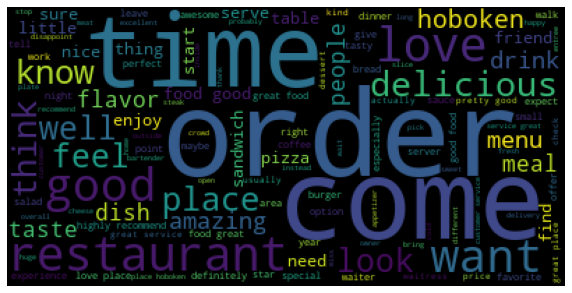

Text(0.5, 1.0, 'Most common words in reviews')

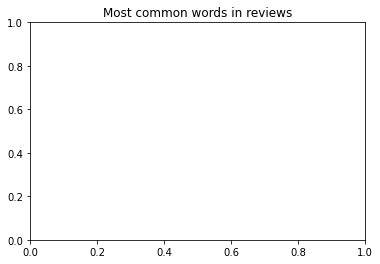

In [69]:
#WordCloud for most common words in the reviews
print('Most common words in review')
plt.figure( figsize=(10,10) )
wc=WordCloud().generate(' '.join(sent_df['Review']))
plt.imshow(wc)
plt.axis('off')
plt.show()



<Figure size 720x720 with 0 Axes>

(-0.5, 399.5, 199.5, -0.5)

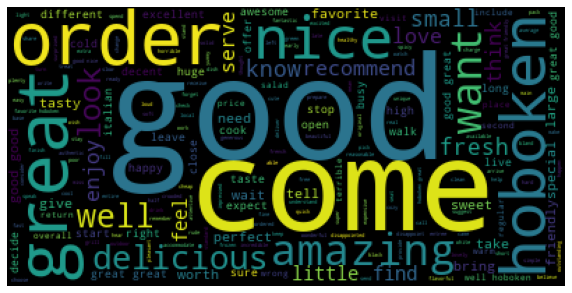

In [85]:
#Most common verb and adjective
plt.figure( figsize=(10,10) )
wc=WordCloud().generate(' '.join(sent_df['verb_adj']))
plt.imshow(wc)
plt.axis('off')
plt.show()
plt.title('Most common Verbs and Adjectives in reviews')